In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float, util, metrics, color
from scipy.ndimage import gaussian_filter, median_filter, convolve
import pandas as pd
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

Types of Noises

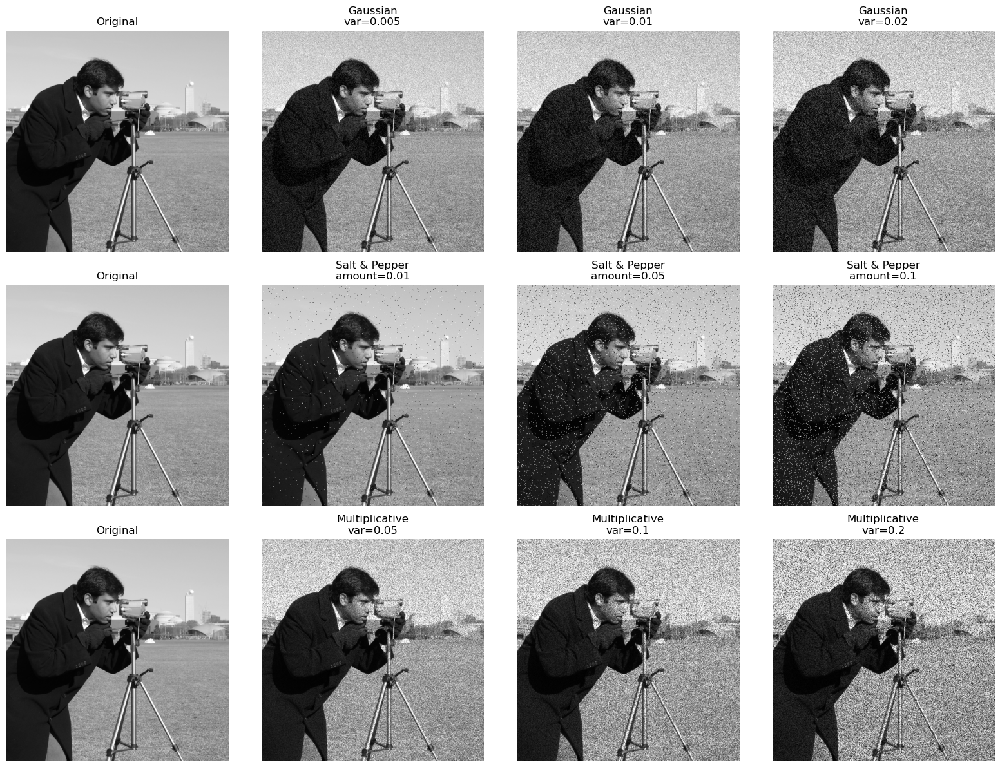

In [2]:

image = data.camera()
image = img_as_float(image)

# Noises
def add_gaussian_noise(img, mean=0, var=0.01):
    noise = np.random.normal(mean, np.sqrt(var), img.shape)
    return np.clip(img + noise, 0, 1)

def add_salt_pepper_noise(img, amount=0.05):
    return util.random_noise(img, mode='s&p', amount=amount)

def add_multiplicative_noise(img, var=0.05):
    noise = np.random.normal(1.0, np.sqrt(var), img.shape)
    return np.clip(img * noise, 0, 1)

# Different values
gaussian_vars = [0.005, 0.01, 0.02]         
salt_pepper_amounts = [0.01, 0.05, 0.1]         
multiplicative_vars = [0.05, 0.1, 0.2]          


gaussian_noises = [add_gaussian_noise(image, var=v) for v in gaussian_vars]
salt_pepper_noises = [add_salt_pepper_noise(image, amount=a) for a in salt_pepper_amounts]
multiplicative_noises = [add_multiplicative_noise(image, var=v) for v in multiplicative_vars]


# Plot
fig, axs = plt.subplots(3, 4, figsize=(16, 12))

for i in range(3):
    axs[i, 0].imshow(image, cmap='gray')
    axs[i, 0].set_title("Original")
    axs[i, 0].axis('off')

for i, noisy_img in enumerate(gaussian_noises):
    axs[0, i+1].imshow(noisy_img, cmap='gray')
    axs[0, i+1].set_title(f"Gaussian\nvar={gaussian_vars[i]}")
    axs[0, i+1].axis('off')

for i, noisy_img in enumerate(salt_pepper_noises):
    axs[1, i+1].imshow(noisy_img, cmap='gray')
    axs[1, i+1].set_title(f"Salt & Pepper\namount={salt_pepper_amounts[i]}")
    axs[1, i+1].axis('off')

for i, noisy_img in enumerate(multiplicative_noises):
    axs[2, i+1].imshow(noisy_img, cmap='gray')
    axs[2, i+1].set_title(f"Multiplicative\nvar={multiplicative_vars[i]}")
    axs[2, i+1].axis('off')

plt.tight_layout()
plt.show()

Spatial Filters

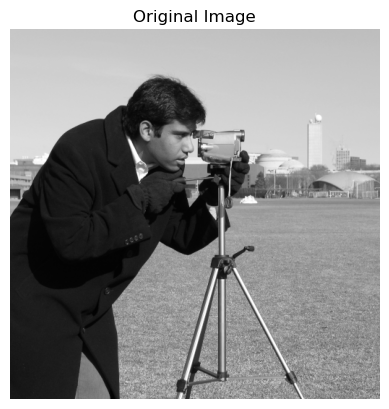

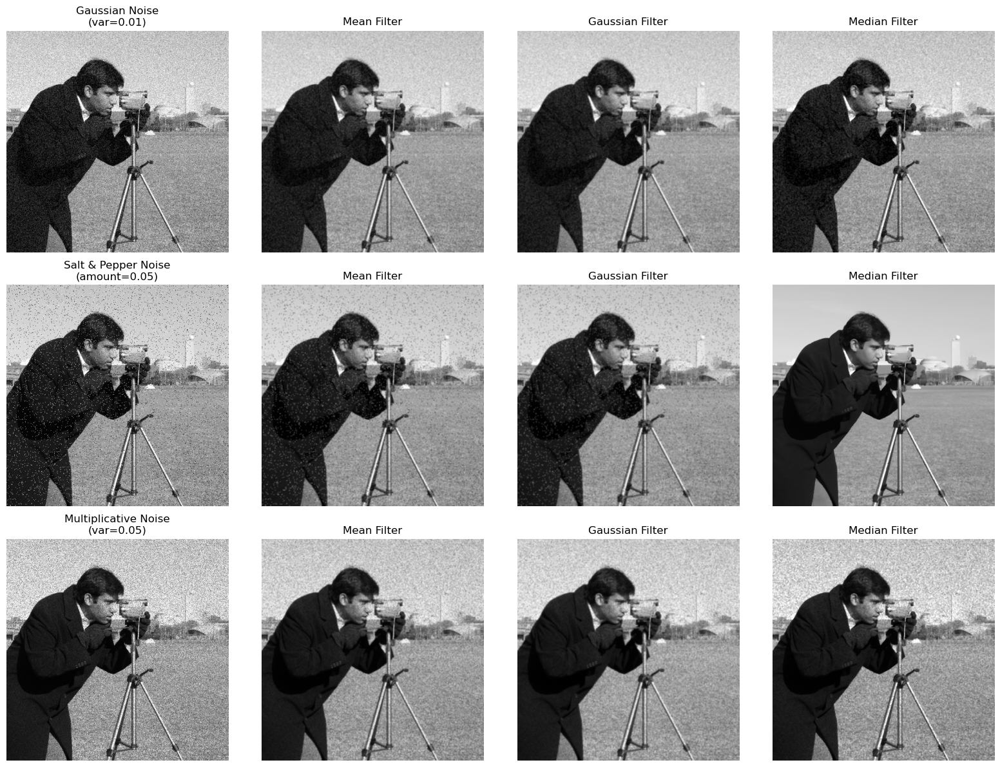

Spatial Filter Performance Metrics:
       Noise Type    Filter       PSNR      SSIM
0        Gaussian      Mean  26.496527  0.569656
1        Gaussian  Gaussian  27.151979  0.635980
2        Gaussian    Median  25.697558  0.491515
3   Salt & Pepper      Mean  24.866676  0.504388
4   Salt & Pepper  Gaussian  25.652137  0.567583
5   Salt & Pepper    Median  30.191505  0.864762
6  Multiplicative      Mean  25.408518  0.578729
7  Multiplicative  Gaussian  26.175982  0.629049
8  Multiplicative    Median  24.161053  0.525665


In [ ]:
image = data.camera()
image = img_as_float(image)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

# Noises
def add_gaussian_noise(img, mean=0, var=0.01):
    noise = np.random.normal(mean, np.sqrt(var), img.shape)
    return np.clip(img + noise, 0, 1)

def add_salt_pepper_noise(img, amount=0.05):
    return util.random_noise(img, mode='s&p', amount=amount)

def add_multiplicative_noise(img, var=0.05):
    noise = np.random.normal(1.0, np.sqrt(var), img.shape)
    return np.clip(img * noise, 0, 1)


# Spatial Filters
def apply_mean_filter(img, size=3):
    kernel = np.ones((size, size), dtype=np.float32) / (size * size)
    return convolve(img, kernel)

def apply_gaussian_filter(img, sigma=1):
    return gaussian_filter(img, sigma=sigma)

def apply_median_filter(img, size=3):
    return median_filter(img, size=size)


# Apply Filters
gaussian_noisy   = add_gaussian_noise(image, var=0.01)       
saltpepper_noisy = add_salt_pepper_noise(image, amount=0.05)   
multiplicative_noisy = add_multiplicative_noise(image, var=0.05)  

def apply_spatial_filters(noisy_img):
    return {
        'Mean': apply_mean_filter(noisy_img, size=3),     
        'Gaussian': apply_gaussian_filter(noisy_img, sigma=1), 
        'Median': apply_median_filter(noisy_img, size=3)     
    }

gaussian_filtered   = apply_spatial_filters(gaussian_noisy)
saltpepper_filtered = apply_spatial_filters(saltpepper_noisy)
multiplicative_filtered = apply_spatial_filters(multiplicative_noisy)


# Plot
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(16, 12))

axs[0,0].imshow(gaussian_noisy, cmap='gray')
axs[0,0].set_title("Gaussian Noise\n(var=0.01)")
for col, filter_key in enumerate(['Mean', 'Gaussian', 'Median'], start=1):
    axs[0, col].imshow(gaussian_filtered[filter_key], cmap='gray')
    axs[0, col].set_title(f"{filter_key} Filter")
    
axs[1,0].imshow(saltpepper_noisy, cmap='gray')
axs[1,0].set_title("Salt & Pepper Noise\n(amount=0.05)")
for col, filter_key in enumerate(['Mean', 'Gaussian', 'Median'], start=1):
    axs[1, col].imshow(saltpepper_filtered[filter_key], cmap='gray')
    axs[1, col].set_title(f"{filter_key} Filter")
    
axs[2,0].imshow(multiplicative_noisy, cmap='gray')
axs[2,0].set_title("Multiplicative Noise\n(var=0.05)")
for col, filter_key in enumerate(['Mean', 'Gaussian', 'Median'], start=1):
    axs[2, col].imshow(multiplicative_filtered[filter_key], cmap='gray')
    axs[2, col].set_title(f"{filter_key} Filter")

for ax in axs.flatten():
    ax.axis('off')
plt.tight_layout()
plt.show()


# PSNR y SSIM
def evaluate(original, denoised):
    data_range = original.max() - original.min()
    psnr = metrics.peak_signal_noise_ratio(original, denoised, data_range=data_range)
    ssim = metrics.structural_similarity(original, denoised, data_range=data_range)
    return psnr, ssim

results = []
noise_filters = [
    ("Gaussian", gaussian_noisy, gaussian_filtered),
    ("Salt & Pepper", saltpepper_noisy, saltpepper_filtered),
    ("Multiplicative", multiplicative_noisy, multiplicative_filtered)
]

for noise_type, noisy_img, filtered_dict in noise_filters:
    for filter_type, filtered_img in filtered_dict.items():
        psnr, ssim = evaluate(image, filtered_img)
        results.append({
            "Noise Type": noise_type,
            "Filter": filter_type,
            "PSNR": psnr,
            "SSIM": ssim
        })
        
df_results = pd.DataFrame(results)
print("Spatial Filter Performance Metrics:")
print(df_results)


FFT Filters

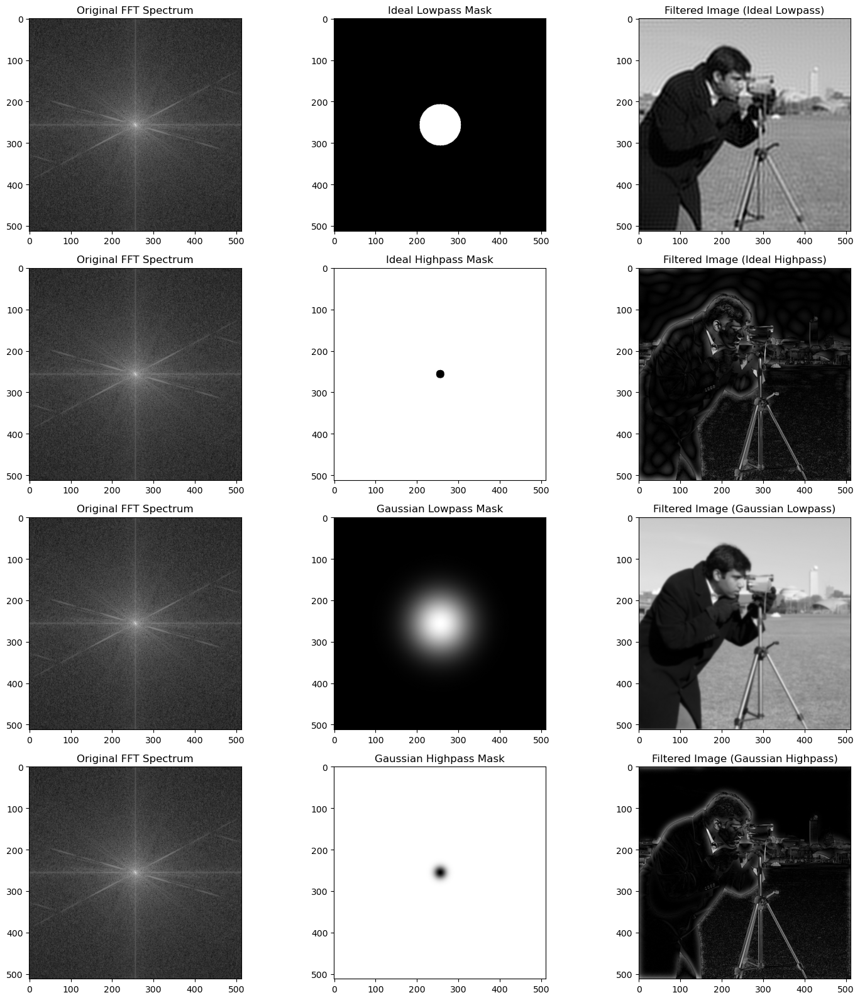

In [4]:
image = data.camera()
image = img_as_float(image)

# FFT-mask (filters)
def fft_mask(shape, filter_type='ideal_low', D0=30):
    M, N = shape
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    
    if filter_type == 'ideal_low':
        H = np.zeros_like(D)
        H[D <= D0] = 1
    elif filter_type == 'ideal_high':
        H = np.zeros_like(D)
        H[D > D0] = 1
    elif filter_type == 'gaussian_low':
        H = np.exp(-(D**2) / (2 * (D0**2)))
    elif filter_type == 'gaussian_high':
        H = 1 - np.exp(-(D**2) / (2 * (D0**2)))
    else:
        raise ValueError("Unknown filter type")
    
    return H

# Apply filters
def apply_fft_filter(img, filter_type='ideal_low', D0=30):
    F = np.fft.fft2(img)
    F_shifted = np.fft.fftshift(F)
    
    H = fft_mask(img.shape, filter_type, D0)
    G_shifted = F_shifted * H
    G = np.fft.ifft2(np.fft.ifftshift(G_shifted))
    filtered = np.abs(G)
    
    mag_spectrum = np.log(1 + np.abs(F_shifted))
    return filtered, H, mag_spectrum

D0_lowpass = 50  # Cutoffs 
D0_highpass = 10  

filter_configs = {
    'Ideal Lowpass': {'type': 'ideal_low', 'D0': D0_lowpass},
    'Ideal Highpass': {'type': 'ideal_high', 'D0': D0_highpass},
    'Gaussian Lowpass': {'type': 'gaussian_low', 'D0': D0_lowpass},
    'Gaussian Highpass': {'type': 'gaussian_high', 'D0': D0_highpass}
}


# Plot
n_filters = len(filter_configs)
plt.figure(figsize=(15, 4 * n_filters))

for i, (filter_name, params) in enumerate(filter_configs.items()):
    filtered_img, mask, mag_spectrum = apply_fft_filter(
        image,
        filter_type=params['type'],
        D0=params['D0']
    )
    
    plt.subplot(n_filters, 3, i * 3 + 1)
    plt.imshow(mag_spectrum, cmap='gray')
    plt.title("Original FFT Spectrum")
    plt.axis()
    
    plt.subplot(n_filters, 3, i * 3 + 2)
    plt.imshow(mask, cmap='gray')
    plt.title(f"{filter_name} Mask")
    plt.axis()
    
    plt.subplot(n_filters, 3, i * 3 + 3)
    plt.imshow(filtered_img, cmap='gray')
    plt.title(f"Filtered Image ({filter_name})")
    plt.axis()

plt.tight_layout()
plt.show()


Different D_0 values (cutoffs)

D0 = 10 -> PSNR: 5.27, SSIM: 0.088
D0 = 20 -> PSNR: 5.15, SSIM: 0.073
D0 = 30 -> PSNR: 5.08, SSIM: 0.065
D0 = 40 -> PSNR: 5.04, SSIM: 0.060
D0 = 50 -> PSNR: 5.00, SSIM: 0.055


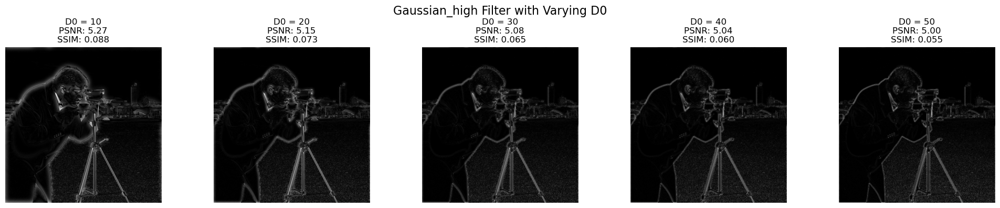

In [9]:
image = data.camera()
image = img_as_float(image)

def fft_mask(shape, filter_type='ideal_low', D0=30):
    M, N = shape
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    
    if filter_type == 'ideal_low':
        H = np.zeros_like(D)
        H[D <= D0] = 1
    elif filter_type == 'ideal_high':
        H = np.zeros_like(D)
        H[D > D0] = 1
    elif filter_type == 'gaussian_low':
        H = np.exp(-(D**2) / (2 * (D0**2)))
    elif filter_type == 'gaussian_high':
        H = 1 - np.exp(-(D**2) / (2 * (D0**2)))
    else:
        raise ValueError("Unknown filter type")
    
    return H

def apply_fft_filter(img, filter_type='ideal_low', D0=30):
    F = np.fft.fft2(img)
    F_shifted = np.fft.fftshift(F)
    
    H = fft_mask(img.shape, filter_type, D0)
    G_shifted = F_shifted * H
    G = np.fft.ifft2(np.fft.ifftshift(G_shifted))
    filtered = np.abs(G)
    
    mag_spectrum = np.log(1 + np.abs(F_shifted))
    return filtered, H, mag_spectrum

#################################################################

# Different D0 for Different Filters
D0_values = [10, 20, 30, 40, 50]
filter_type = 'gaussian_high'

filtered_images = {}
metric_results = {}

for D0 in D0_values:
    filtered_img, mask, mag_spectrum = apply_fft_filter(image, filter_type=filter_type, D0=D0)
    filtered_images[D0] = filtered_img
    psnr_val = metrics.peak_signal_noise_ratio(image, filtered_img, data_range=image.max() - image.min())
    ssim_val = metrics.structural_similarity(image, filtered_img, data_range=image.max() - image.min())
    metric_results[D0] = (psnr_val, ssim_val)
    print(f"D0 = {D0:2d} -> PSNR: {psnr_val:.2f}, SSIM: {ssim_val:.3f}")


# Plot
fig, axs = plt.subplots(1, len(D0_values), figsize=(20, 4))
fig.suptitle(f"{filter_type.capitalize()} Filter with Varying D0", fontsize=16)

for i, D0 in enumerate(D0_values):
    axs[i].imshow(filtered_images[D0], cmap='gray')
    psnr_val, ssim_val = metric_results[D0]
    axs[i].set_title(f"D0 = {D0}\nPSNR: {psnr_val:.2f}\nSSIM: {ssim_val:.3f}")
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()


FFT Filters for Different Noises

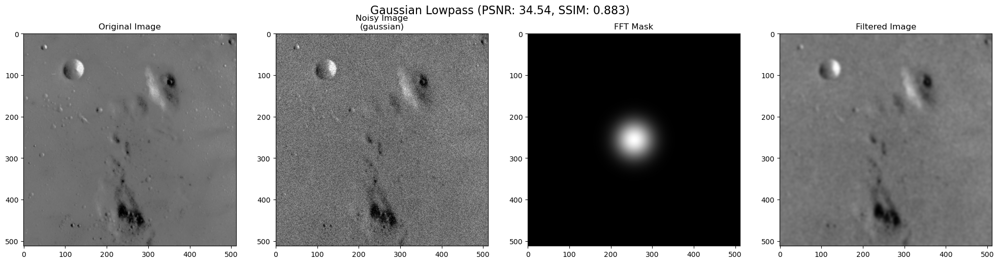

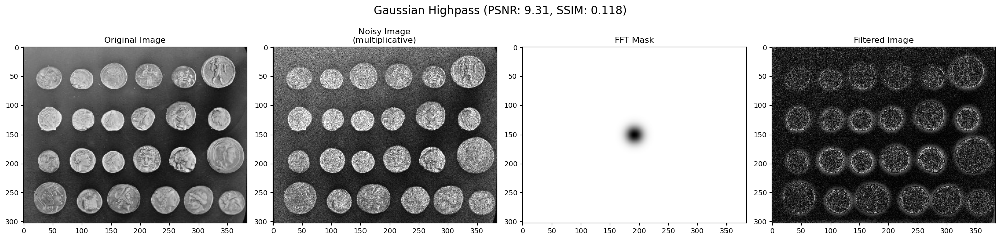

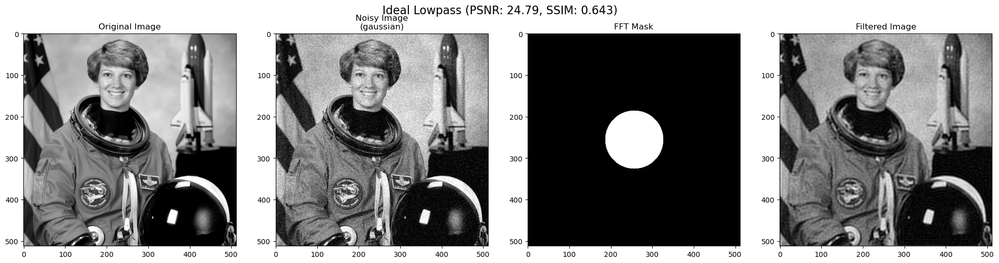

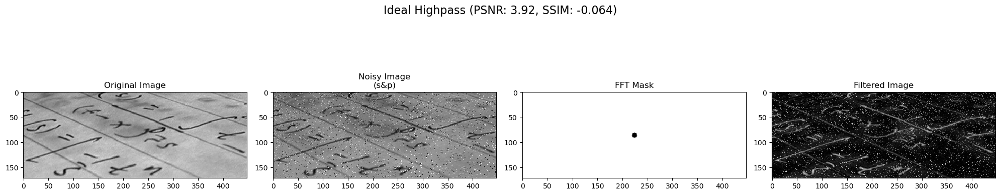

In [11]:
def fft_mask(shape, filter_type='ideal_low', D0=30):
    M, N = shape
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    
    if filter_type == 'ideal_low':
        H = np.zeros_like(D)
        H[D <= D0] = 1
    elif filter_type == 'ideal_high':
        H = np.zeros_like(D)
        H[D > D0] = 1
    elif filter_type == 'gaussian_low':
        H = np.exp(-(D**2) / (2 * (D0**2)))
    elif filter_type == 'gaussian_high':
        H = 1 - np.exp(-(D**2) / (2 * (D0**2)))
    else:
        raise ValueError("Unknown filter type")
    
    return H

def apply_fft_filter(img, filter_type='ideal_low', D0=30):
    F = np.fft.fft2(img)
    F_shifted = np.fft.fftshift(F)
    H = fft_mask(img.shape, filter_type, D0)
    G_shifted = F_shifted * H
    G = np.fft.ifft2(np.fft.ifftshift(G_shifted))
    filtered = np.abs(G)
    return filtered, H


def add_noise(img, noise_type='gaussian'):
    if noise_type == 'gaussian':
        return util.random_noise(img, mode='gaussian', var=0.01)
    elif noise_type == 's&p':
        return util.random_noise(img, mode='s&p', amount=0.05)
    elif noise_type == 'multiplicative':
        noise = np.random.normal(1.0, 0.2236, img.shape)
        return np.clip(img * noise, 0, 1)
    else:
        return img

########################################################################

# Image + noise + filter 
tests = [
    {'name': 'Gaussian Lowpass', 
     'image': img_as_float(data.moon()), 
     'noise': 'gaussian', 
     'filter': 'gaussian_low', 
     'D0': 30},
     
    {'name': 'Gaussian Highpass', 
     'image': img_as_float(data.coins()), 
     'noise': 'multiplicative', 
     'filter': 'gaussian_high', 
     'D0': 10},
     
    {'name': 'Ideal Lowpass', 
     'image': img_as_float(color.rgb2gray(data.astronaut())), 
     'noise': 'gaussian', 
     'filter': 'ideal_low', 
     'D0': 70},
     
    {'name': 'Ideal Highpass', 
     'image': img_as_float(data.text()), 
     'noise': 's&p', 
     'filter': 'ideal_high', 
     'D0': 5}
]


# Plot
for test in tests:
    orig = test['image']
    noisy = add_noise(orig, noise_type=test['noise'])
    
    filtered, mask = apply_fft_filter(noisy, filter_type=test['filter'], D0=test['D0'])
    
    psnr_val = metrics.peak_signal_noise_ratio(orig, filtered, data_range=orig.max()-orig.min())
    ssim_val = metrics.structural_similarity(orig, filtered, data_range=orig.max()-orig.min())
    
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(test['name'] + f" (PSNR: {psnr_val:.2f}, SSIM: {ssim_val:.3f})", fontsize=16)
    
    axs[0].imshow(orig, cmap='gray')
    axs[0].set_title("Original Image")
    axs[0].axis()
    
    axs[1].imshow(noisy, cmap='gray')
    axs[1].set_title(f"Noisy Image\n({test['noise']})")
    axs[1].axis()
    
    axs[2].imshow(mask, cmap='gray')
    axs[2].set_title("FFT Mask")
    axs[2].axis()
    
    axs[3].imshow(filtered, cmap='gray')
    axs[3].set_title("Filtered Image")
    axs[3].axis()
    
    plt.tight_layout()
    plt.show()
